In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [2]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

In [3]:
# !pip install xgboost

In [4]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.style.use('ggplot')
plt.rcParams["font.family"] = "Times New Roman"

# Задание - Предсказание уровня экспресси белка

<img src='https://www.researchgate.net/publication/313504607/figure/fig3/AS:459880453677066@1486655453033/Protein-protein-interaction-PPI-network-of-DEGs-by-STRING-The-interaction-score-was.png'>




<div class="alert alert-info">
<b>Про биологию</b>
    
Экспрессия — процесс, в ходе которого наследственная информация от гена (последовательности нуклеотидов ДНК) преобразуется в функциональный продукт — белок. Уровнем экспрессии называют - количество белка, производящегося в этом процессе. Чем выше экспрессия белка, тем большее количество этого белка появляется в клетках человека. 
    
    

<div class="alert alert-info">    
<b>Важность задачи</b>
    
Существует множество причин необходимости в знании уровня экспресии белка. Например - это позволяет ученым разрабатывать лекарственные средства и оптимизировать их разработку. Теперь вам предстоит побыть в роли биоинформатика и помочь науке!
    
</div>


<div class="alert alert-info">
<b>Про Датасет</b>
    
Датасет представляет собой граф взаимойдествия белков. Где узлы это белки, взаимодействие между белками это ребро. 

Для каждого белка известен уровень его экспрессии. Ниже приведен список ребер `edges`. Информация по экспрессии белков, разбитая на `train` и `test`.
   
    
</div>

In [5]:
#Список ребер графа 

edges = pd.read_csv("https://raw.githubusercontent.com/a-milenkin/Otus_HW_protein_expression/main/edges.csv", sep=",") # Подгрузим данные
edges.head(2)

,node_1,node_2
0,344,50
1,344,153


In [6]:
#Подгрузим тренирочную выборку
train = pd.read_csv("https://raw.githubusercontent.com/a-milenkin/Otus_HW_protein_expression/main/train.csv", sep=",") # Подгрузим данные
display(train.head(2), len(train))

,target,node
0,0.251968,11142
1,0.689541,2243


8000

In [7]:
# Подгрузим отложенную выборку для валидации
test = pd.read_csv("https://raw.githubusercontent.com/a-milenkin/Otus_HW_protein_expression/main/test.csv", sep=",")
display(test.head(2), len(test))

,target,node
0,0.279231,817
1,0.380795,9574


2000

<div class="alert alert-info">
<b>Про Задачу</b>
    
Вам предлагается предсказать экспрессию белков (`target`) по приведенным данным для отложенной выборки. Ответы в отложенной выборке `test` даны вам для самостоятельной валидации.


    
   
    

<div class="alert alert-info">
<b>Замечание и комментарии</b>
    
    

По ряду причин датасет был упрощен так, чтобы выполнялись следующие условия:
* у графа одна компонента связанности. 
* удалены слишком крупные хабы
* плотность связей графа уменьшена
* решить задачу можно классическими ML подходами
    
   

<div class="alert alert-info">
<b>Оценка результатов</b>
    


Оценка точности модели будет оцениваться по метрике MSE на отложенной выборке `test`
        
</div>

<div class="alert alert-info">
<b>Автор задачи</b>

По всем дополнительным вопросами писать Александру Миленькину
* Телеграмм: Alerin75infskin
* Почта: milenkin.aa@phystech.edu
        
</div>

=========================================================================================================

# Создание графа и генерация признаков

In [8]:
G = nx.Graph()
edges = edges.values.tolist()
G.add_edges_from(edges)

## Генерация признаков для узлов

In [9]:
new_gen_features = True

In [10]:
if new_gen_features:
    print("Calculating Closeness Centrality...")
    closeness = nx.closeness_centrality(G)  # Мера близости узла ко всем остальным узлам
    
    print("Calculating Eigenvector Centrality...")
    eigenvector = nx.eigenvector_centrality(G)  # Мера влияния узла с учетом важности его соседей
    
    print("Calculating Clustering Coefficient...")
    clustering = nx.clustering(G)  # Мера того, насколько тесно связаны соседи узла
    
    print("Calculating Degree...")
    degree = dict(G.degree())  # Количество соседей узла
    
    print("Calculating PageRank...")
    pagerank = nx.pagerank(G)  # Алгоритм ранжирования узлов на основе вероятности переходов
    
    print("Calculating Betweenness Centrality...")
    betweenness = nx.betweenness_centrality(G, normalized=True, k=100)  # Центральность по посредничеству, ускоренная версия
    
    print("Calculating Harmonic Centrality...")
    harmonic = nx.harmonic_centrality(G)  # Мера близости узла, но с использованием обратных расстояний
    
    print("Calculating Degree Centrality...")
    degree_centrality = nx.degree_centrality(G)  # Нормированная степень узла, доля всех возможных связей
    
    print("All calculations are complete.")

Calculating Closeness Centrality...
Calculating Eigenvector Centrality...
Calculating Clustering Coefficient...
Calculating Degree...
Calculating PageRank...
Calculating Betweenness Centrality...
Calculating Harmonic Centrality...
Calculating Degree Centrality...
All calculations are complete.


## датафрейм с признаками для узлов

In [11]:
if new_gen_features:
    graph_features = pd.DataFrame({
        'node': list(G.nodes()),
        'degree': [degree[node] for node in G.nodes()],
        'clustering': [clustering[node] for node in G.nodes()],
        'closeness': [closeness[node] for node in G.nodes()],
        'eigenvector': [eigenvector[node] for node in G.nodes()],
        'pagerank': [pagerank[node] for node in G.nodes()], 
        'betweenness': [betweenness[node] for node in G.nodes()],
        'harmonic': [harmonic[node] for node in G.nodes()],
        'degree_centrality': [degree_centrality[node] for node in G.nodes()] 
    })

    train = pd.merge(train, graph_features, on='node', how='left')
    test = pd.merge(test, graph_features, on='node', how='left')
    # train.to_csv("train_features.csv")
    # test.to_csv("test_features.csv")

In [12]:
if not new_gen_features:
    train = pd.read_csv("train_features.csv")
    test = pd.read_csv("test_features.csv")
    train.drop(columns="Unnamed: 0", inplace=True)
    test.drop(columns="Unnamed: 0", inplace=True)
    train.head(3)

# EDA

In [13]:
# Корреляционная матрица для признаков

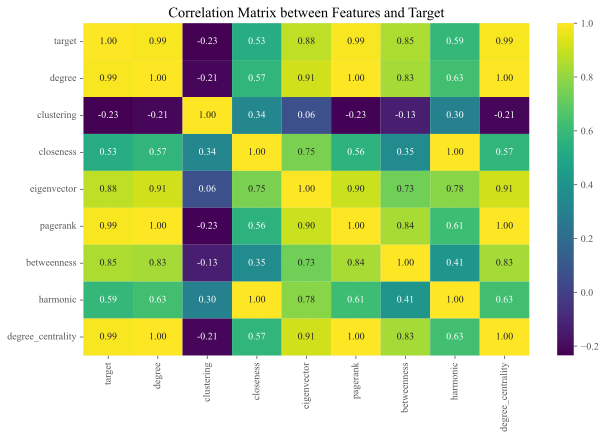

In [14]:
plt.figure(figsize=(10, 6))
correlation_matrix = train.drop(columns="node").corr()
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f")
plt.title('Correlation Matrix between Features and Target')
plt.show()

In [15]:
def plot_graph_features(df, target_col='target', features=None):
    
    if not features:
        features = df.drop(columns=target_col).columns.to_list()   
    
    n_features = len(features)
    n_cols = 2
    n_rows = math.ceil(n_features / n_cols)
    
    fig, ax = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
    axes = ax.flatten()

    for i, feature in enumerate(features):
        axes[i].set_title(f"{feature.capitalize()} vs {target_col.capitalize()}", fontsize=14)
        axes[i].set_xlabel(feature.capitalize(), fontsize=12)
        axes[i].set_ylabel(target_col.capitalize(), fontsize=12)
        axes[i].scatter(df[feature], df[target_col], edgecolors='white', s=55, c='dimgray')

    fig.subplots_adjust(hspace=0.3, wspace=0.3)
    plt.show()

In [16]:
plot_graph_features(train.drop(columns="node"))

======================================================================================================

# Modeling

In [17]:
# XGBOOST

In [18]:
train.drop(columns=["target", "node"]).columns.to_list()

['degree',
 'clustering',
 'closeness',
 'eigenvector',
 'pagerank',
 'betweenness',
 'harmonic',
 'degree_centrality']

In [19]:
features = ['degree',
             'clustering',
             'closeness',
             'eigenvector',
             'pagerank',
             'betweenness',
             'harmonic',
             'degree_centrality'
           ]
X_train = train[features]
y_train = train['target']

X_test = test[features]
y_test = test['target']

In [20]:
param_grid_xgb = {
    'n_estimators': [ 250, 300, 350, 400, 500],
    'learning_rate': [0.025, 0.005, 0.01, 0.015],
    'max_depth': [3, 4, 5, 6]
}

xgb_model = XGBRegressor(objective='reg:squarederror', random_state=13)

In [21]:
grid_search_xgb = GridSearchCV(estimator=xgb_model, param_grid=param_grid_xgb, scoring='neg_mean_squared_error', cv=5, verbose=1)
grid_search_xgb.fit(X_train, y_train)

Fitting 5 folds for each of 80 candidates, totalling 400 fits


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=13, ...),
             param_grid={'learning_rate': [0.025, 0.005, 0.01, 0.015],
                         'max_depth': [3, 4, 5, 6],
                         'n_estimators': [250, 300, 350, 400, 500]},
             scoring='neg_mean_squared_error', verbose=1)

In [22]:
train_preds = grid_search_xgb.predict(X_train)
train_mse = mean_squared_error(y_train, train_preds)
train_r2 = r2_score(y_train, train_preds)
print(f"Лучшие параметры XGBoost: {grid_search_xgb.best_params_}")
print(f"Train MSE: {train_mse}, Train R²: {train_r2}")

Лучшие параметры XGBoost: {'learning_rate': 0.015, 'max_depth': 3, 'n_estimators': 400}
Train MSE: 0.013304356221558586, Train R²: 0.9706229649964397


In [23]:
test_preds = grid_search_xgb.predict(X_test)
test_mse = mean_squared_error(y_test, test_preds)
test_r2 = r2_score(y_test, test_preds)
print(f"Test MSE: {test_mse}, Test R²: {test_r2}")

Test MSE: 0.026903801243217753, Test R²: 0.9642277038949657


In [24]:
def plot_true_vs_pred(y_true, y_pred, title="Предсказания"):
    plt.figure(figsize=(10, 6))
    plt.scatter(y_true, y_pred,  edgecolors='white', s=55, c='dimgray')
    plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], 'k--', lw=2)
    plt.title(f'True vs Predicted Values ({title})')
    plt.xlabel('True Values')
    plt.ylabel('Predicted Values')
    plt.tight_layout()
    plt.show()

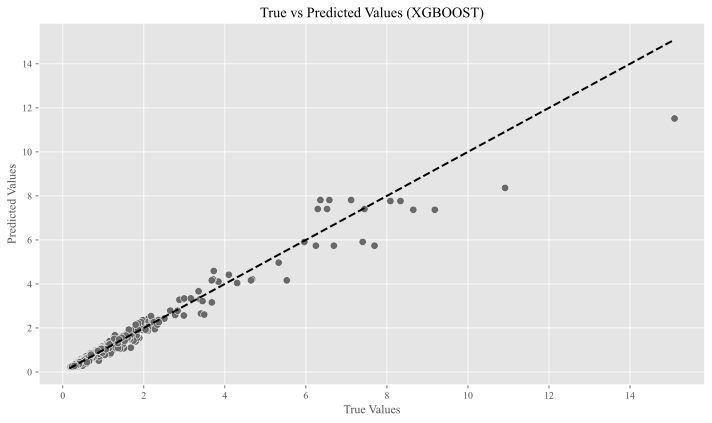

In [25]:
plot_true_vs_pred(y_test, test_preds, "XGBOOST")

----------------------------------------------------------------------------------------------------

In [26]:
# RAndomForest

In [27]:
param_grid_rf = {
    'n_estimators': [200, 300, 400],
    'max_depth': [ 6, 8, 10],
    'min_samples_split': [2, 3]
}

In [28]:
rf_model = RandomForestRegressor(random_state=42)
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid_rf, scoring='neg_mean_squared_error', cv=5, verbose=1)
grid_search_rf.fit(X_train, y_train)
print(f"Лучшие параметры RandomForest: {grid_search_rf.best_params_}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Лучшие параметры RandomForest: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 400}


In [29]:
train_preds_rf = grid_search_rf.predict(X_train)
train_mse_rf = mean_squared_error(y_train, train_preds_rf)
train_r2_rf = r2_score(y_train, train_preds_rf)

test_preds_rf = grid_search_rf.predict(X_test)
test_mse_rf = mean_squared_error(y_test, test_preds_rf)
test_r2_rf = r2_score(y_test, test_preds_rf)

print(f"Train MSE (RandomForest): {train_mse_rf}, Train R²: {train_r2_rf}")
print(f"Test MSE (RandomForest): {test_mse_rf}, Test R²: {test_r2_rf}")

Train MSE (RandomForest): 0.0026204672924358356, Train R²: 0.9942138080119329
Test MSE (RandomForest): 0.014909321377631955, Test R²: 0.9801760110318902


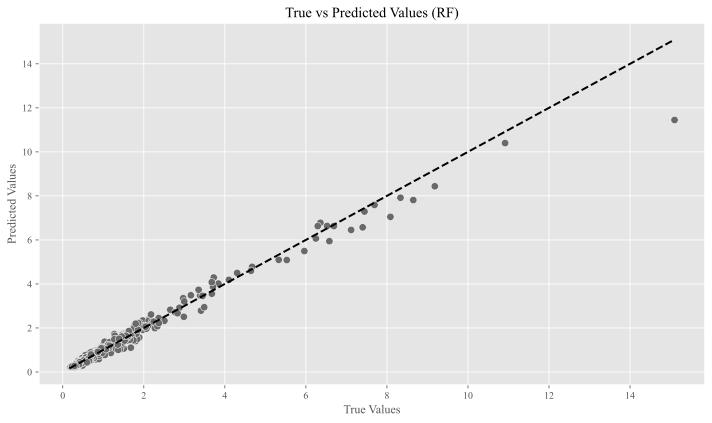

In [30]:
plot_true_vs_pred(y_test, test_preds_rf, "RF")

In [31]:
linreg_model = LinearRegression()
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
linreg_model.fit(X_train_scaled, y_train)

LinearRegression()

In [32]:
train_preds_lr = linreg_model.predict(X_train_scaled)
train_mse_lr = mean_squared_error(y_train, train_preds_lr)
train_r2_lr = r2_score(y_train, train_preds_lr)

test_preds_lr = linreg_model.predict(X_test_scaled)
test_mse_lr = mean_squared_error(y_test, test_preds_lr)
test_r2_lr = r2_score(y_test, test_preds_lr)

print(f"Train MSE (LinearRegression): {train_mse_lr}, Train R²: {train_r2_lr}")
print(f"Test MSE (LinearRegression): {test_mse_lr}, Test R²: {test_r2_lr}")

Train MSE (LinearRegression): 0.006859590788524842, Train R²: 0.984853499459218
Test MSE (LinearRegression): 0.008785670302290398, Test R²: 0.9883182455633861


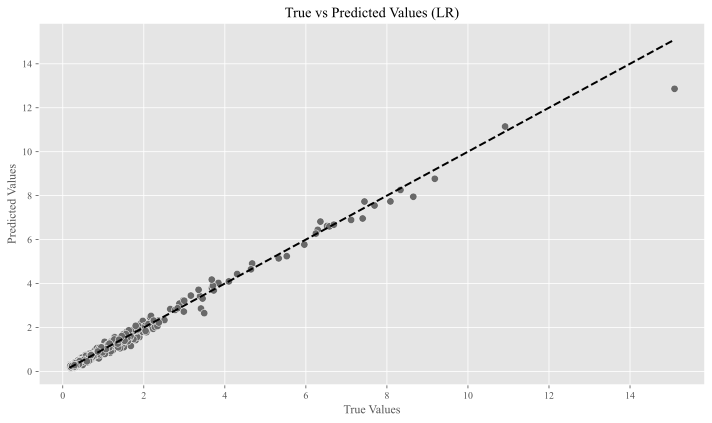

In [33]:
plot_true_vs_pred(y_test, test_preds_lr, title="LR")